In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns # For creating plots
import matplotlib.ticker as mtick # For specifying the axes tick format 
import matplotlib.pyplot as plt
%matplotlib inline


#Let's make this notebook reproducible, you can use any number ex = 42
np.random.seed(42)


# set plot style for all plots
plt.style.use('ggplot')


# https://www.webucator.com/blog/2015/03/python-color-constants-module/

In [2]:
df = pd.read_csv('./../../../new_repo_2_wavelet_inter_case_features/marlon_inter_inter_case_features_data/inter_Production.csv', sep=';')
df.head()

,Part_Desc_,Rework,Work_Order_Qty,Case ID,label,Activity,Resource,Report_Type,Resource.1,Qty_Completed,...,en_event,nr_cases,nr_past_events,nr_ongoing_cases,cr_cases_intensity,complete_cases_intensity,hour_day,day_week,day_month,month_year
0,Cable Head,missing,250,Case178,regular,Round Grinding - Machine 3,ID4445,D,Machine 3 - Round Grinding,31,...,34,1,0.0,5,0.000000,0.0,1.0,2.0,24.0,1.0
1,Electrical Contact,missing,320,Case238,deviant,Turning & Milling - Machine 4,ID4794,S,Machine 4 - Turning & Milling,0,...,15,2,0.0,18,0.000000,0.0,11.0,4.0,5.0,1.0
2,Cable Head,missing,200,Case187,deviant,Lapping - Machine 1,ID4882,D,Machine 1 - Lapping,0,...,28,3,0.0,48,0.000000,0.0,1.0,1.0,16.0,1.0
3,Cable Head,missing,250,Case178,regular,Round Grinding - Machine 2,ID4355,S,Machine 2 - Round Grinding,0,...,34,3,1.0,5,0.005405,0.0,1.0,2.0,24.0,1.0
4,Compound Dies,missing,18,Case263,regular,Turning & Milling - Machine 8,ID4219,S,Machine 8 - Turning & Milling,0,...,22,4,0.0,41,0.000000,0.0,13.0,2.0,10.0,1.0


In [22]:
df = df.drop(['Case ID','Complete Timestamp'], axis = 1) 

In [23]:
cols =  list(df.select_dtypes(include=['object', 'category']).columns)
cols

['Part_Desc_', 'Rework', 'Activity', 'Resource', 'Report_Type', 'Resource.1']

In [24]:
df = pd.get_dummies(df, prefix=cols, columns=cols)
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2489 entries, 0 to 2488
Columns: 139 entries, Work_Order_Qty to Resource.1_other
dtypes: float64(10), int64(13), uint8(116)
memory usage: 729.3 KB


In [25]:
# We will use the data frame where we had created dummy variables
y = df['label'].values
X = df.drop(columns = ['label'])

# Scaling all the variables to a range of 0 to 1
from sklearn.preprocessing import MinMaxScaler


features = X.columns.values

scaler = MinMaxScaler(feature_range = (0,1))

scaler.fit(X)

X = pd.DataFrame(scaler.transform(X))

X.columns = features

In [26]:
#data, labels = shap.datasets.adult(display=True)
# data_classes = [ar", "deviant"]
# df['label'] = df['label'].apply(data_classes.index)
# df['label']

data = X
labels = y
labels = np.array([int(label) for label in labels])
data.shape, labels.shape

((2489, 138), (2489,))

In [27]:
# cat_cols = data.select_dtypes(['category']).columns
# data[cat_cols] = data[cat_cols].apply(lambda x: x.cat.codes)
# data.head()

In [28]:
import pandas as pd
import numpy as np
import model_evaluation_utils as meu
import matplotlib.pyplot as plt
from collections import Counter
import shap
import eli5

import warnings
warnings.filterwarnings('ignore')
plt.style.use('fivethirtyeight')
%matplotlib inline

shap.initjs()

In [29]:
#import Counter
Counter(labels)

Counter({0: 1121, 1: 1368})

In [30]:
from sklearn.model_selection import train_test_split

# cat_cols = data.select_dtypes(['category']).columns
# data[cat_cols] = data[cat_cols].apply(lambda x: get_dummies(x))
# data.head()

X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=0.3, random_state=42)
X_train.shape, X_test.shape

((1742, 138), (747, 138))

In [31]:
data_disp, labels_disp = data, labels
X_train_disp, X_test_disp, y_train_disp, y_test_disp = train_test_split(data_disp, labels_disp, test_size=0.3, random_state=42)
X_train_disp.shape, X_test_disp.shape

((1742, 138), (747, 138))

In [32]:
%%time

import xgboost as xgb

xgc = xgb.XGBClassifier(n_estimators=500, max_depth=5, base_score=0.5,
                        objective='binary:logistic', random_state=42)
xgc.fit(X_train, y_train)

CPU times: user 25.8 s, sys: 723 ms, total: 26.5 s
Wall time: 4.24 s


In [33]:
predictions = xgc.predict(X_test)
predictions[:10]

array([1, 1, 1, 0, 0, 0, 0, 1, 1, 0])

In [34]:
class_labels = list(set(labels))
meu.display_model_performance_metrics(true_labels=y_test, predicted_labels=predictions, classes=class_labels)

Model Performance metrics:
------------------------------
Accuracy: 0.9906
Precision: 0.9906
Recall: 0.9906
F1 Score: 0.9906

Model Classification report:
------------------------------
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       343
           1       0.99      0.99      0.99       404

    accuracy                           0.99       747
   macro avg       0.99      0.99      0.99       747
weighted avg       0.99      0.99      0.99       747


Prediction Confusion Matrix:
------------------------------
          Predicted:     
                   0    1
Actual: 0        339    4
        1          3  401


# Default Model Interpretation Methods

By default it is difficult to gauge on specific model interpretation methods for machine learning models out of the box. 
Parametric models like logistic regression are easier to interpret given that the total number of parameters of the model
are fixed regardless of the volume of data and one can make some interpretation of the model's prediction decisions leveraging
the parameter coefficients.

Non-parametric models are harder to interpret given that the total number of parameters remain unbounded and increase
with the increase in the data volume. Some non-parametric models like tree-based models do have some out of the box model 
interpretation methods like feature importance which helps us in understanding which features might be influential in
the model making its prediction decisions

## Classic feature importances from XGBoost

Here we try out the global feature importance calcuations that come with XGBoost. The model enables us to view feature importances based on the following.

- __Feature Weights:__ This is based on the number of times a feature appears in a tree across the ensemble of trees
- __Gain:__ This is based on the average gain of splits which use the feature
- __Coverage:__ This is based on the average coverage (number of samples affected) of splits which use the feature

Note that they all contradict each other, which motivates the use of model interpretation frameworks like SHAP which uses something known as SHAP values, which claim to come with consistency guarantees (meaning they will typically order the features correctly).

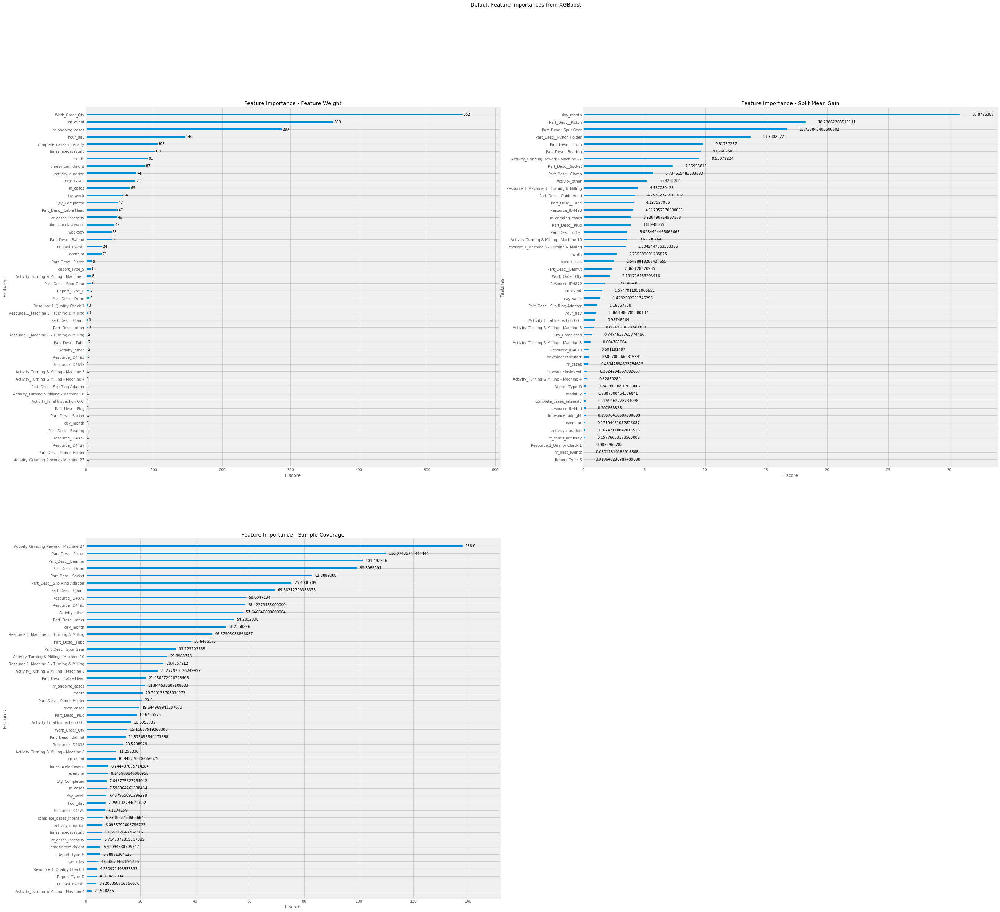

In [35]:
fig = plt.figure(figsize = (40, 40))
title = fig.suptitle("Default Feature Importances from XGBoost", fontsize=14)

ax1 = fig.add_subplot(2,2, 1)
xgb.plot_importance(xgc, importance_type='weight', ax=ax1)
t=ax1.set_title("Feature Importance - Feature Weight")

ax2 = fig.add_subplot(2,2, 2)
xgb.plot_importance(xgc, importance_type='gain', ax=ax2)
t=ax2.set_title("Feature Importance - Split Mean Gain")

ax3 = fig.add_subplot(2,2, 3)
xgb.plot_importance(xgc, importance_type='cover', ax=ax3)
t=ax3.set_title("Feature Importance - Sample Coverage")

# Model Interpretation with ELI5

[__ELI5__](https://github.com/TeamHG-Memex/eli5) is a Python package which helps to debug machine learning classifiers and explain their predictions in an easy to understand an intuitive way. It is perhaps the easiest of the three machine learning frameworks to get started with since it involves minimal reading of documentation! However it doesn't support true model-agnostic interpretations and support for models are mostly limited to tree-based and other parametric\linear models. Let's look at some intuitive ways of model interpretation with ELI5 on our classification model. 

### Installation Instructions

We recommend installing this framework using __`pip install eli5`__ since the `conda` version appears to be a bit out-dated. Also feel free to check out [__the documentation__](https://eli5.readthedocs.io/en/latest/overview.html) as needed.

## Feature Importances with ELI5

Typically for tree-based models ELI5 does nothing special but uses the out-of-the-box feature importance computation methods which we discussed in the previous section. By default, __'gain'__ is used, that is the average gain of the feature when it is used in trees.

In [36]:
eli5.show_weights(xgc.get_booster())

Weight,Feature
0.1657,day_month
0.0979,Part_Desc__Piston
0.0898,Part_Desc__Spur Gear
0.0737,Part_Desc__Punch Holder
0.0527,Part_Desc__Drum
0.0517,Part_Desc__Bearing
0.0511,Activity_Grinding Rework - Machine 27
0.0395,Part_Desc__Socket
0.0308,Part_Desc__Clamp
0.0281,Activity_other


## Explaining Model Prediction Decisions with ELI5

One of the best way to explain model prediction decisions to either a technical or a more business-oriented individual, is to  examine individual data-point predictions. Typically, ELI5 does this by showing weights for each feature depicting how influential it might have been in contributing to the final prediction decision across all trees. The idea for weight calculation is described in http://blog.datadive.net/interpreting-random-forests/; ELI5 provides an independent implementation of this algorithm for XGBoost and most scikit-learn tree ensembles which is definitely on the path towards model-agnostic interpretation but not purely model-agnostic like LIME.

Typically, the prediction can be defined as the sum of the feature contributions + the “bias” (i.e. the mean given by the topmost region that covers the entire training set)

In [37]:
doc_num = 0
print('Actual Label:', y_test[doc_num])
print('Predicted Label:', predictions[doc_num])
eli5.show_prediction(xgc.get_booster(), X_test.iloc[doc_num], 
                     feature_names=list(data.columns) ,show_feature_values=True)

Actual Label: 1
Predicted Label: 1


In [39]:
doc_num = 4
print('Actual Label:', y_test[doc_num])
print('Predicted Label:', predictions[doc_num])
eli5.show_prediction(xgc.get_booster(), X_test.iloc[doc_num], feature_names=list(data.columns) ,show_feature_values=True)

Actual Label: 0
Predicted Label: 0


## Explaining Model Predictions with Skater using LIME

Skater can leverage LIME to explain model predictions. Typically, its __`LimeTabularExplainer`__ class helps in explaining predictions on tabular (i.e. matrix) data. For numerical features, it perturbs them by sampling from a Normal(0,1) and doing the inverse operation of mean-centering and scaling, according to the means and stds in the training data. For categorical features, it perturbs by sampling according to the training distribution, and making a binary feature that is 1 when the value is the same as the instance being explained. The __`explain_instance()`__ function generates explanations for a prediction. First, we generate neighborhood data by randomly perturbing features from the instance. We then learn locally weighted linear (surrogate) models on this neighborhood data to explain each of the classes in an interpretable way.

Since XGBoost has some issues with feature name ordering when building models with dataframes, we will build our same model with numpy arrays to make LIME work without additional hassles of feature re-ordering. Remember the model being built is the same ensemble model which we treat as our black box machine learning model

In [40]:
xgc_np = xgb.XGBClassifier(n_estimators=500, max_depth=5, base_score=0.5,
                        objective='binary:logistic', random_state=42)
xgc_np.fit(X_train.values, y_train)

XGBClassifier(base_score=0.5, booster=None, colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints=None,
              learning_rate=0.300000012, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              n_estimators=500, n_jobs=0, num_parallel_tree=1,
              objective='binary:logistic', random_state=42, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method=None,
              validate_parameters=False, verbosity=None)

In [41]:
from skater.core.local_interpretation.lime.lime_tabular import LimeTabularExplainer

exp = LimeTabularExplainer(X_test.values, feature_names=list(data.columns), 
                           discretize_continuous=True, 
                           class_names=['deviant', 'regular'])

In [45]:
doc_num = 0
print('Actual Label:', y_test[doc_num])
print('Predicted Label:', predictions[doc_num])
exp.explain_instance(X_test.iloc[doc_num].values, xgc_np.predict_proba).show_in_notebook()

Actual Label: 1
Predicted Label: 1


In [44]:
doc_num = 4
print('Actual Label:', y_test[doc_num])
print('Predicted Label:', predictions[doc_num])
exp.explain_instance(X_test.iloc[doc_num].values, xgc_np.predict_proba).show_in_notebook()

Actual Label: 0
Predicted Label: 0


## Path to more interpretable models with Tree Surrogates using Skater

We have see various ways to interpret machine learning models with features, dependence plots and even LIME. But can we build an approximation or a surrogate model which is more interpretable from a really complex black box model like our XGBoost model having hundreds of decision trees?

Here in, we introduce the novel idea of using __`TreeSurrogates`__ as means for explaining a model's learned decision policies (for inductive learning tasks), which is inspired by the work of Mark W. Craven described as the TREPAN algorithm. 

We recommend checking out the following excellent papers on the TREPAN algorithm to build surrogate trees.
 - [_Mark W. Craven(1996) EXTRACTING COMPREHENSIBLE MODELS FROM TRAINED NEURAL NETWORKS_](http://ftp.cs.wisc.edu/machine-learning/shavlik-group/craven.thesis.pdf)
 - [_Mark W. Craven and Jude W. Shavlik(NIPS, 96). Extracting Thee-Structured Representations of Thained Networks_](https://papers.nips.cc/paper/1152-extracting-tree-structured-representations-of-trained-networks.pdf)

Briefly, Trepan constructs a decision tree in a best-first manner. It maintains a queue of leaves which are expanded into subtrees as they are removed from the queue. With each node in the queue, Trepan stores,

 - a subset of the training examples, 
 - another set of instances (query instances),
 - a set of constraints. 

The stored subset of training examples consists simply of those examples that reach the node. The query instances are used, along with the training examples, to select the splitting test if the node is an internal node or to determine the class
label if it is a leaf. The constraint set describes the conditions that instances must satisfy in order to reach the node; this information is used when drawing a set of query instances for a newly created node. The process of expanding a node in Trepan is much like it is in conventional decision tree algorithms: a splitting test is selected for the node, and a child is created for each outcome of the test. Each child is either made a leaf of the tree or put into the queue for future expansion.


For Skater's implementation, for building explainable surrogate models, the base estimator(Oracle) could be any form of a supervised learning predictive model - our black box model. The explanations are approximated using Decision Trees(both for Classification/Regression) by learning decision boundaries similar to that learned by the Oracle (predictions from the base model are used for learning the Decision Tree representation). The implementation also generates a fidelity score to quantify tree based surrogate model’s approximation to the Oracle. Ideally, the score should be 0 for truthful explanation both globally and locally. Let's check this out in action!

__NOTE:__ :: Experimental :: The implementation is currently experimental and might change in future.

### Using the interpreter instance invoke call to the TreeSurrogate

In [47]:
from skater.core.explanations import Interpretation
from skater.model import InMemoryModel
interpreter = Interpretation(training_data=X_test, training_labels=y_test, feature_names=list(data.columns))
im_model = InMemoryModel(xgc.predict_proba, examples=X_train, target_names=['devian', 'regular'])

surrogate_explainer = interpreter.tree_surrogate(oracle=im_model, seed=42)

In [48]:
surrogate_explainer = interpreter.tree_surrogate(oracle=im_model, seed=42)

### Using the surrogate model to learn the decision boundaries learned by the base estimator
 - Reports the fidelity value when compared to the base estimator (closer to 0 is better)
 - Learner uses F1 score as the default metric of choice for classification.

In [49]:
X_train = X_train.fillna(0)
surrogate_explainer.fit(X_train, y_train, use_oracle=True, prune='pre', scorer_type='f1')

2020-05-09 07:32:31,338 - skater.core.global_interpretation.tree_surrogate - INFO - pre pruning applied ...
2020-05-09 07:32:31,338 - skater.core.global_interpretation.tree_surrogate - INFO - Scorer used f1-score
2020-05-09 07:32:32,144 - skater.core.global_interpretation.tree_surrogate - INFO - Done generating prediction using the surrogate, shape (1742, 2)
2020-05-09 07:32:32,147 - skater.core.global_interpretation.tree_surrogate - INFO - Done scoring, surrogate score 0.856; oracle score 1.0
2020-05-09 07:32:32,148 - skater.core.global_interpretation.tree_surrogate - WARNING - impurity score: 0.144 of the surrogate model is higher than the impurity threshold: 0.01. The higher the impurity score, lower is the fidelity/faithfulness of the surrogate model


0.144

### Taking a look at the position for each feature
- We do this since the feature names in the surrogate tree are not displayed (but are present in the model)

In [50]:
pd.DataFrame([('X'+str(idx), feature) for (idx, feature) in enumerate(data.columns)]).T

,0,1,2,3,4,5,6,7,8,9,...,128,129,130,131,132,133,134,135,136,137
0,X0,X1,X2,X3,X4,X5,X6,X7,X8,X9,...,X128,X129,X130,X131,X132,X133,X134,X135,X136,X137
1,Work_Order_Qty,Qty_Completed,Qty_for_MRB,activity_duration,timesincemidnight,month,weekday,hour,timesincelastevent,timesincecasestart,...,Resource.1_Machine 4 - Turning & Milling,Resource.1_Machine 5 - Turning & Milling,Resource.1_Machine 6 - Turning & Milling,Resource.1_Machine 7- Laser Marking,Resource.1_Machine 8 - Turning & Milling,Resource.1_Machine 9 - Turning & Milling,Resource.1_Packing,Resource.1_Quality Check 1,Resource.1_Wire Cut - Machine 13,Resource.1_other


### Visualizing the Surrogate Tree

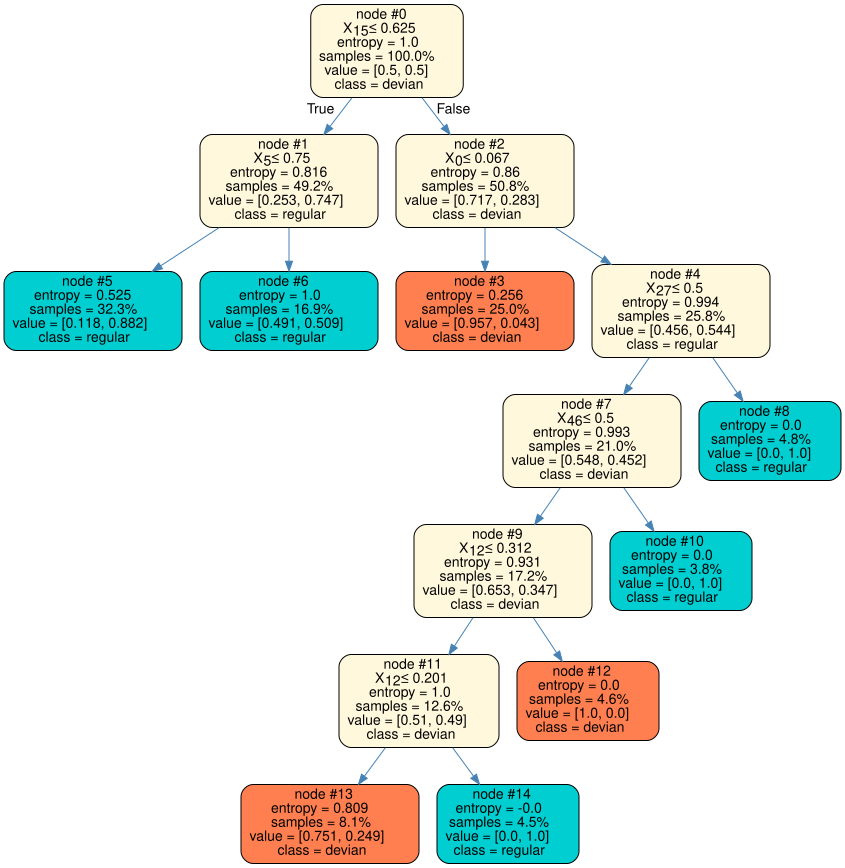

In [51]:
from skater.util.dataops import show_in_notebook
from graphviz import Source
from IPython.display import SVG

graph = Source(surrogate_explainer.plot_global_decisions(colors=['coral', 'darkturquoise'], 
                                          file_name='test_tree_pre.png').to_string())
svg_data = graph.pipe(format='svg')
with open('dtree_structure.svg','wb') as f:
    f.write(svg_data)
SVG(svg_data)

### Interesting rules from the surrogate tree

Here are some interesting rules you can observe from the above tree
- If `Relationship` < 0.5 (means 0) and `Education-num` <= 9.5 and `Capital Gain` <= 4225 __→__ 70% chance of person making <= \$50K 
- If `Relationship` < 0.5 (means 0) and `Education-num` <= 9.5 and `Capital Gain` >= 4225 __→__ 94.5% chance of person making > \$50K 
- If `Relationship` < 0.5 (means 0) and `Education-num` >= 9.5 and `Educatin-num` is also >= 12.5 __→__ 94.7% chance of person making > \$50K 

Feel free to derive more interesting rules from this and also your own models! Let's look at how our surrogate model performs on the test dataset now

### Surrogate Model Performance Evaluation

Just as expected, the model performance drops a fair bit but still we get an overall F1 score of 83% as compared to our boosted model's score of 87% which is quite good!

In [52]:
surrogate_predictions = surrogate_explainer.predict(X_test)
class_labels = list(set(labels))
meu.display_model_performance_metrics(true_labels=y_test, predicted_labels=surrogate_predictions, classes=class_labels)

Model Performance metrics:
------------------------------
Accuracy: 0.8568
Precision: 0.8631
Recall: 0.8568
F1 Score: 0.8551

Model Classification report:
------------------------------
              precision    recall  f1-score   support

           0       0.91      0.76      0.83       343
           1       0.82      0.94      0.88       404

    accuracy                           0.86       747
   macro avg       0.87      0.85      0.85       747
weighted avg       0.86      0.86      0.86       747


Prediction Confusion Matrix:
------------------------------
          Predicted:     
                   0    1
Actual: 0        262   81
        1         26  378


# Model Interpretation with SHAP

**SHAP (SHapley Additive exPlanations)** is a unified approach to explain the output of any machine learning model. SHAP connects game theory with local explanations, uniting several previous methods and representing the only possible consistent and locally accurate additive feature attribution method based on what they claim! (do check out the [SHAP NIPS paper](http://papers.nips.cc/paper/7062-a-unified-approach-to-interpreting-model-predictions) for details).



### Install

SHAP can be installed from [PyPI](https://pypi.org/project/shap)

```
pip install shap
```

or [conda-forge](https://anaconda.org/conda-forge/shap)

```
conda install -c conda-forge shap 
```

The really awesome aspect about this framework is while SHAP values can explain the output of any machine learning model, for really complex ensemble models it can be slow. But they have developed a high-speed exact algorithm for tree ensemble methods ([Tree SHAP arXiv paper](https://arxiv.org/abs/1802.03888)). Fast C++ implementations are supported for *XGBoost*, *LightGBM*, *CatBoost*, and *scikit-learn* tree models!

SHAP (SHapley Additive exPlanations) assigns each feature an importance value for a particular prediction. Its novel components include: the identification of a new class of additive feature importance measures, and theoretical results showing there is a unique solution in this class with a set of desirable properties. Typically, SHAP values try to explain the output of a model (function) as a sum of the effects of each feature being introduced into a conditional expectation. Importantly, for non-linear functions the order in which features are introduced matters. The SHAP values result from averaging over all possible orderings. Proofs from game theory show this is the only possible consistent approach. 

An intuitive way to understand the Shapley value is the following: The feature values enter a room in random order. All feature values in the room participate in the game (= contribute to the prediction). The Shapley value __$ϕ_{ij}$__ is the average marginal contribution of feature value __$x_{ij}$__ by joining whatever features already entered the room before, i.e.

$$\phi_{ij}=\sum_{\text{All.orderings}}val(\{\text{features.before.j}\}\cup{}x_{ij})-val(\{\text{features.before.j}\})$$

The following figure from the KDD 18 paper, [_Consistent Individualized Feature Attribution for Tree Ensembles_](https://arxiv.org/pdf/1802.03888.pdf) summarizes this in a nice way!

![](https://i.imgur.com/6Rc1dsa.png)

Let's now dive into SHAP and leverage it for interpreting our model!

## Explain predictions with SHAP

Here we use the Tree SHAP implementation integrated into XGBoost to explain the test dataset! Remember that there are a variety of explainer methods based on the type of models you are building. We estimate the SHAP values for a set of samples (test data)

In [53]:
explainer = shap.TreeExplainer(xgc)
shap_values = explainer.shap_values(X_test)

In [54]:
pd.DataFrame(shap_values).head()

,0,1,2,3,4,5,6,7,8,9,...,128,129,130,131,132,133,134,135,136,137
0,6.858199,0.000062,0.0,-0.108896,0.021833,0.158074,0.011391,0.0,0.084824,0.063211,...,0.0,0.016392,0.0,0.0,-0.012471,0.0,0.0,0.001688,0.0,0.0
1,-0.913752,0.093829,0.0,-0.128430,0.268674,2.360765,0.052847,0.0,0.062337,-0.084743,...,0.0,0.035288,0.0,0.0,-0.022093,0.0,0.0,0.008489,0.0,0.0
2,5.289796,-0.029460,0.0,0.137107,-0.037261,1.019104,0.014035,0.0,0.036725,0.039596,...,0.0,0.014775,0.0,0.0,-0.008132,0.0,0.0,-0.002694,0.0,0.0
3,-1.662912,0.077353,0.0,0.025754,-0.323888,1.577472,-0.204073,0.0,0.051081,0.015071,...,0.0,0.021485,0.0,0.0,-0.022093,0.0,0.0,0.013683,0.0,0.0
4,-2.043097,0.266310,0.0,0.052538,-0.436478,-0.370176,-0.001662,0.0,0.146141,0.265651,...,0.0,0.053088,0.0,0.0,-0.052104,0.0,0.0,-0.022280,0.0,0.0


This returns a matrix of SHAP values (`# samples x # features`). Each row sums to the difference between the model output for that sample and the expected value of the model output (which is stored as `expected_value` attribute of the explainer). Typically this difference helps us in explaining why the model is inclined on predicting a specific class outcome.

In [55]:
print('Expected Value:', explainer.expected_value)

Expected Value: 0.29721168


In [121]:
shap.force_plot(explainer.expected_value, shap_values[0,:], X.iloc[0,:])

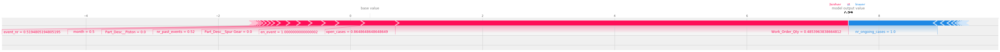

In [159]:
fig = shap.force_plot(explainer.expected_value, shap_values[0,:], X_test_disp.iloc[0,:],matplotlib=True,
                      figsize=(50,3))
plt.tight_layout()
pl.savefig("./shap/force_plot.pdf")

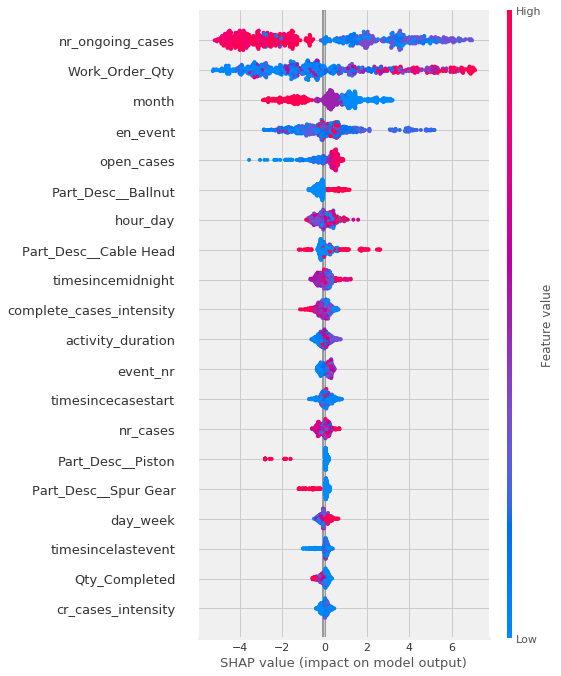

In [149]:

import matplotlib.pyplot as pl
shap.summary_plot(shap_values, X_test, show=False)
plt.tight_layout()
pl.savefig("./shap/summary_plot.pdf")

In [85]:
#shap.force_plot(explainer.expected_value, shap_values[0,:], X_test_disp.iloc[0,:])
fig = shap.force_plot(explainer.expected_value, shap_values[0,:], X_test_disp.iloc[0,:])
fig
#plt.savefig('scratch.png')

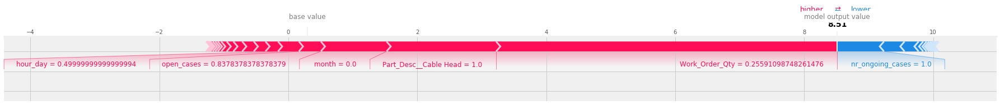

In [158]:
fig = shap.force_plot(explainer.expected_value, shap_values[2,:], X_test_disp.iloc[2,:],matplotlib=True,
                      figsize=(25,3))
plt.tight_layout()
pl.savefig("./shap/true_force_plot.pdf")

In [183]:
shap.force_plot(explainer.expected_value, shap_values[14,:], X_test_disp.iloc[14,:])

In [58]:
shap.force_plot(explainer.expected_value, shap_values[2,:], X_test_disp.iloc[2,:])

## Visualizing and explaining multiple predictions

One of the key advantages of SHAP is it can build beautiful interactive plots which can visualize and explain multiple predictions at once. Here we visualize model prediction decisions for the first 1000 test data samples.

In [162]:
fig = shap.force_plot(explainer.expected_value, shap_values[:1000,:], X_test_disp.iloc[:1000,:],
                      figsize=(50,8))
plt.tight_layout()
pl.savefig("./shap/ongoing_force_plot.pdf")

<Figure size 432x288 with 0 Axes>

In [59]:
shap.force_plot(explainer.expected_value, shap_values[:1000,:], X_test_disp.iloc[:1000,:])

## Feature Importances with SHAP

This basically takes the average of the SHAP value magnitudes across the dataset and plots it as a simple bar chart.

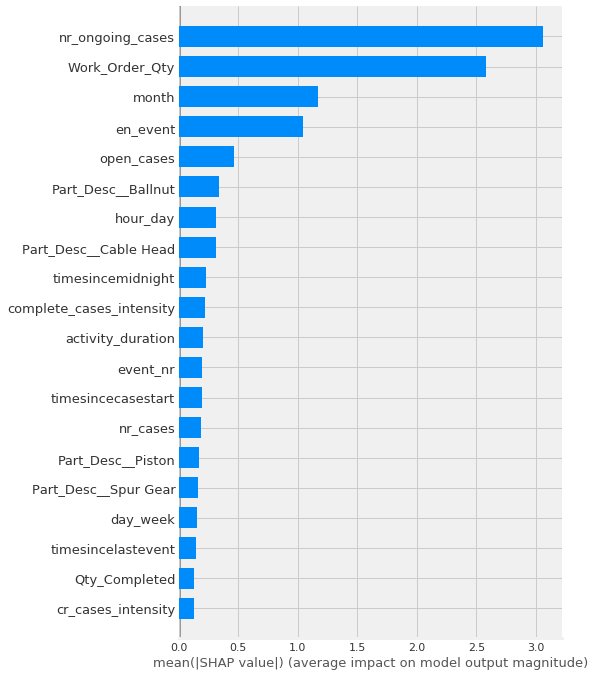

In [163]:
shap.summary_plot(shap_values, X_test, plot_type="bar")
plt.tight_layout()
pl.savefig("./shap/feature_importance.pdf")

## SHAP Summary Plot

Besides a typical feature importance bar chart, SHAP also enables us to use a density scatter plot of SHAP values for each feature to identify how much impact each feature has on the model output for individuals in the validation dataset. Features are sorted by the sum of the SHAP value magnitudes across all samples. It is interesting to note that the age and marital status feature has more total model impact than the captial gain feature, but for those samples where capital gain matters it has more impact than age or marital status. In other words, capital gain effects a few predictions by a large amount, while age or marital status effects all predictions by a smaller amount.

Note that when the scatter points don't fit on a line they pile up to show density, and the color of each point represents the feature value of that individual.

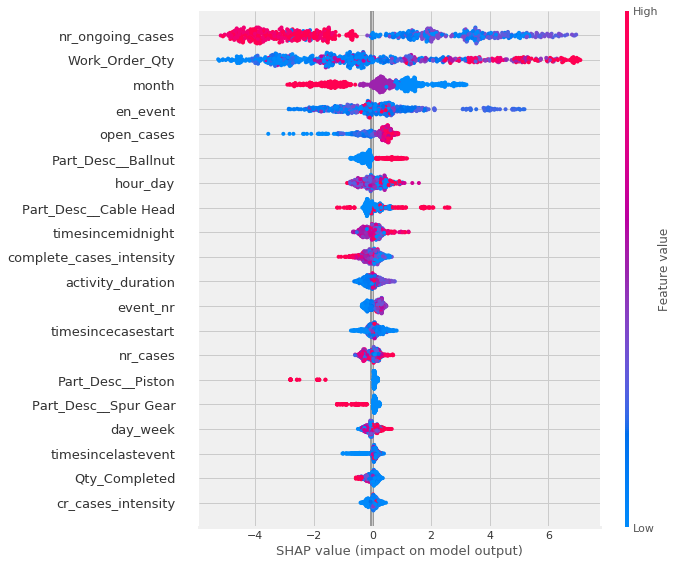

In [61]:
shap.summary_plot(shap_values, X_test)

## SHAP Dependence Plots

SHAP dependence plots show the effect of a single (or two) feature across the whole dataset. They plot a feature's value vs. the SHAP value of that feature across many samples. SHAP dependence plots are similar to partial dependence plots, but account for the interaction effects present in the features, and are only defined in regions of the input space supported by data. The vertical dispersion of SHAP values at a single feature value is driven by interaction effects, and another feature can be chosen for coloring to highlight possible interactions.

You will also notice it's similarity with Skater's Partial Dependence Plots!

In [165]:
X_test_disp['nr_ongoing_cases']

1057    1.000000
478     0.000000
976     1.000000
422     0.104167
1399    0.104167
          ...   
1537    0.854167
1977    0.270833
1311    0.375000
2194    0.854167
1225    1.000000
Name: nr_ongoing_cases, Length: 747, dtype: float64

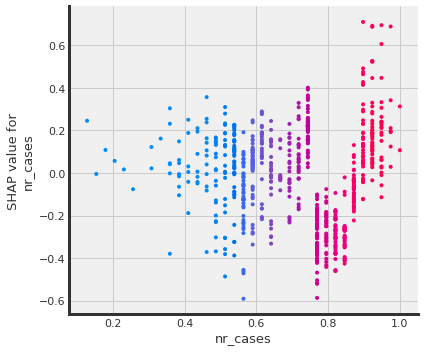

In [173]:
shap.dependence_plot(ind='nr_cases', interaction_index='nr_cases',
                     shap_values=shap_values, 
                     features=X_test,  
                     display_features=X_test_disp)

plt.tight_layout()
pl.savefig("./shap/pdp_nr_cases.pdf")

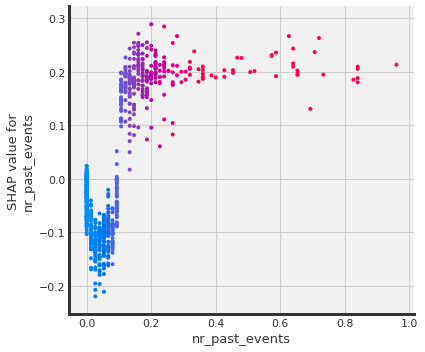

In [169]:
shap.dependence_plot(ind='nr_past_events', interaction_index='nr_past_events',
                     shap_values=shap_values, 
                     features=X_test,  
                     display_features=X_test_disp)


plt.tight_layout()
pl.savefig("./shap/pdp_nr_pastevents.pdf")

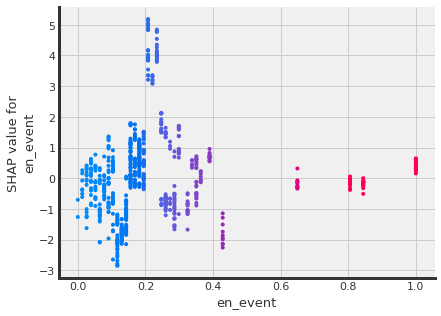

In [65]:
shap.dependence_plot(ind='en_event', interaction_index='en_event',
                     shap_values=shap_values, 
                     features=X_test,  
                     display_features=X_test_disp)

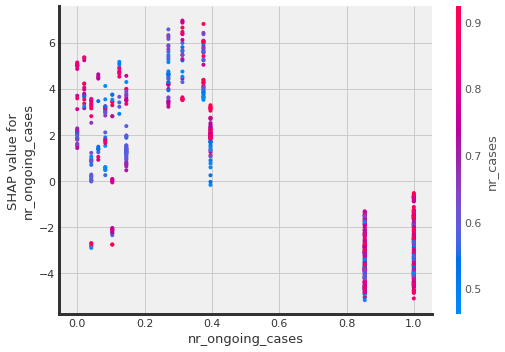

In [175]:
shap.dependence_plot(ind='nr_ongoing_cases', interaction_index='nr_cases', 
                     shap_values=shap_values, features=X_test, 
                     display_features=X_test_disp)

plt.tight_layout()
pl.savefig("./shap/pdp_nr_cases_ongoing.pdf")

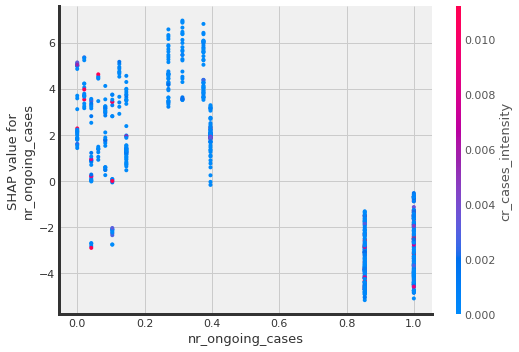

In [177]:
shap.dependence_plot(ind='nr_ongoing_cases', interaction_index='cr_cases_intensity', 
                     shap_values=shap_values, features=X_test, 
                     display_features=X_test_disp)

plt.tight_layout()
pl.savefig("./shap/pdp_case_intensity_ongoing.pdf")

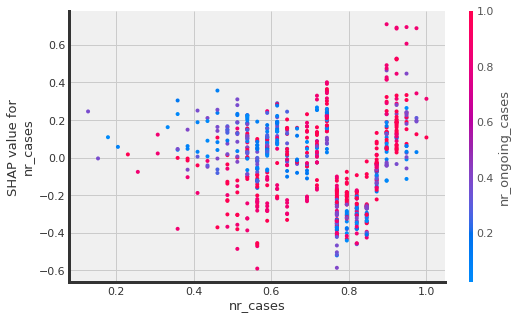

In [179]:
shap.dependence_plot(ind='nr_cases', interaction_index='nr_ongoing_cases', 
                     shap_values=shap_values, features=X_test, 
                     display_features=X_test_disp)